## 統計學習初論 期末專案 -- 台灣超級籃球聯賽球員類型分群與球隊戰績討論
### 簡介
在籃球界裡，我們習慣將球員分成五種：控球後衛(Point guard)、得分後衛(Shooting guard)、小前鋒(Small forward)、大前鋒(Power forward)、中鋒(Center)，但隨著時代的演變，這樣的分類已經漸漸失去意義，往往相同位置的球員卻有著完全不同的特性與能力，故我們希望藉由超級籃球聯賽(SBL)官方網站所提供的球員數據，以這些數據來將球員的分群做的更為仔細，如：將同為後衛的球員分為進攻型、防守型、綜合型，抑或是對於球員的分類有新的定義，如：明星球員類。		
接著再以分好群的球員，來針對每年戰績較佳、奪冠隊伍、國家隊伍來進行隊伍組成的檢視，並加以觀察近年較佳球隊的球員類型的變化，或是國家隊徵招的陣容是否合宜以及改進的可能性。

### 資料來源
[超級籃球聯賽官方網站](https://sbl.choxue.com/)

### 步驟
#### Frame the problem and look at the big picture.
* 台灣籃球員分類
* 冠軍隊伍組成
* 國家隊伍組成

#### Get the data.
* 爬蟲
    [超級籃球聯賽官方網站](https://sbl.choxue.com/)

#### Explore the data to gain insights.（淺顯易懂的資料解釋）
* 放散布圖（E.g.表現好的球員：上場時間比較多）

#### Prepare the data to better expose the underlying data patterns to Machine Learning algorithms.
* data preprocessing (增加維度：生出進階 by 公式)
* dimension reduction by LDA, t-SNE, PCA.

#### Explore many different models and short-list the best ones.
* different ways of clustering? 
* k-means
* HAC

#### Fine-tune your models and combine them into a great solution. Present your solution.
* visualize the result

#### Launch, monitor, and maintain your system.

---

#### 資料爬取
* 首先到[超級籃球聯賽官方網站](https://sbl.choxue.com/)爬取總共16個例行賽季的出賽球員名單的個人數據網頁
* 將每個個人數據網頁依序寫入 "playURL.txt "

In [ ]:
from selenium import webdriver
from selenium.webdriver.support.ui import Select
import time

f = open('playerURL.txt', 'w')
page = "https://sbl.choxue.com/stats"

driver = webdriver.Chrome('chromedriver')
driver.get(page)
time.sleep(5)

seasons = ['S16 例行賽','S15 例行賽','S14 例行賽','S13 例行賽','S12 例行賽','S11 例行賽','S10 例行賽','S9 例行賽','S8 例行賽',
         'S7 例行賽','S6 例行賽','S5 例行賽','S4 例行賽','S3 例行賽','S2 例行賽','S1 例行賽',]


for s in seasons:
    Select(driver.find_element_by_id("sortable-menu")).select_by_visible_text(s)
    time.sleep(5)
    tbl = driver.find_element_by_class_name("table-condensed")
    a = tbl.find_elements_by_tag_name('a')
    for i in a:
        f.write(i.get_attribute('href'))
        f.write('\n')

driver.quit()
f.close()

#### 開啟 "playerURL.txt" 依序到球員的個人數據網頁爬取其基本資料以及聯盟數據，並將其寫入 "player.csv"
* 當寫入時遇到錯誤時，

In [ ]:
url = open('playerURL.txt','r')
driver = webdriver.Chrome('chromedriver')
f = open('player.csv', 'w')

for u in url:
    driver.get(u)
    time.sleep(5)
    
    name = driver.find_element_by_tag_name('h1')
    try:
        f.write(name.text)
        f.write(',')
    except:
        f.write("error")
        f.write(',')
        
    col = driver.find_elements_by_class_name("col-xs-6")
    for i in col:
        a = i.find_elements_by_tag_name('p')
        for j in a:
            b = j.find_element_by_tag_name('strong')
            try:
                f.write(j.text.replace(b.text,''))
                f.write(',')
            except:
                f.write('error')
                f.write(',')
    tbl = driver.find_element_by_class_name("table-responsive")
    a = tbl.find_elements_by_tag_name('td')
    for i in a:
        if i.text != "----":
            try:
                f.write(i.text)
                f.write(',')
            except:
                f.write('error')
                f.write(',')
    f.write('\n')

driver.quit()
f.close()
url.close()

### 資料清洗

In [ ]:
# clean chinese===========================
df['Height'] = list(map(lambda x: ''.join([c for c in x if c in '1234567890.']), df['Height']))
df['Weight'] = list(map(lambda x: ''.join([c for c in x if c in '1234567890.']), df['Weight']))


# remove players who did not play over 5 games==
df = df[ df['TotalGames'] > 5]


# one hot encoding========================
df2 = pd.get_dummies(df['Pos'])
df = df.join(df2)


# remove % in raw data=====================
df['2ptsPercentage'] = list(map(lambda x: float(''.join([c for c in x if c in '1234567890.']))/100, df['2ptsPercentage']))
df['3ptsPercentage'] = list(map(lambda x: float(''.join([c for c in x if c in '1234567890.']))/100, df['3ptsPercentage']))
df['ftPercentage'] = list(map(lambda x: float(''.join([c for c in x if c in '1234567890.']))/100, df['ftPercentage']))
df['fgPercentage'] = list(map(lambda x: float(''.join([c for c in x if c in '1234567890.']))/100, df['fgPercentage']))


# new data frame with split value columns =======
new = df["2ptsPG"].str.split("-", n = 1, expand = True)
df["2ptsM_PG"]= new[0]
df["2ptsA_PG"]= new[1]

new = df["3ptsPG"].str.split("-", n = 1, expand = True)
df["3ptsM_PG"]= new[0]
df["3ptsA_PG"]= new[1]

new = df["ftPG"].str.split("-", n = 1, expand = True)
df["ftM_PG"]= new[0]
df["ftA_PG"]= new[1]

new = df["Total2pts"].str.split("-", n = 1, expand = True)
df["2ptsM_Total"]= new[0]
df["2ptsA_Total"]= new[1]

new = df["Total3pts"].str.split("-", n = 1, expand = True)
df["3ptsM_Total"]= new[0]
df["3ptsA_Total"]= new[1]

new = df["TotalFT"].str.split("-", n = 1, expand = True)
df["ftM_Total"]= new[0]
df["ftA_Total"]= new[1]

new = df["fgPG"].str.split("-", n = 1, expand = True)
df["fgM_PG"]= new[0]
df["fgA_PG"]= new[1]

new = df["Totalfg"].str.split("-", n = 1, expand = True)
df["fgM_Total"]= new[0]
df["fgA_Total"]= new[1]

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties
import os
import pandas as pd
import numpy as np

ChineseFont2 = FontProperties(fname='./MingLiU.ttf')

df = pd.read_csv('player_cleanV6_3.csv', encoding = 'big5')

### 取出需要的feature，將G, F, C轉成0, 1, 2。

In [2]:
xtrain = df[['Nationality',
             'CTteam',
             'Height',
             'Weight',
             'ptsPG',
             'rebPG',
             'astPG',
             'toPG',
             'stlPG',
             'blkPG',
             'pfPG',
             '2ptsPercentage',
             '3ptsPercentage',
             'ftPercentage',
             'fgPercentage',
             '2ptsM_PG',
             '2ptsA_PG',
             '3ptsM_PG',
             '3ptsA_PG',
             'ftM_PG',
             'ftA_PG',
             'fgM_PG',
             'fgA_PG'
]]

pos2num = {'G':0, 'F':1, 'C':2}
ytrain = [pos2num[i] for i in df['Pos']]

#### 考慮每25分鐘的累積數據

In [3]:
df['pts_25min'] = 25*df.ptsPG/df.MinutesPlayedPG
df['reb_25min'] = 25*df.rebPG/df.MinutesPlayedPG
df['ast_25min'] = 25*df.astPG/df.MinutesPlayedPG
df['to_25min'] = 25*df.toPG/df.MinutesPlayedPG
df['stl_25min'] = 25*df.stlPG/df.MinutesPlayedPG
df['blk_25min'] = 25*df.blkPG/df.MinutesPlayedPG
df['pf_25min'] = 25*df.pfPG/df.MinutesPlayedPG
df['2ptsM_25min'] = 25*df['2ptsM_PG']/df.MinutesPlayedPG
df['2ptsA_25min'] = 25*df['2ptsA_PG']/df.MinutesPlayedPG
df['3ptsM_25min'] = 25*df['3ptsM_PG']/df.MinutesPlayedPG
df['3ptsA_25min'] = 25*df['3ptsA_PG']/df.MinutesPlayedPG
df['ftM_25min'] = 25*df.ftM_PG/df.MinutesPlayedPG
df['ftA_25min'] = 25*df.ftA_PG/df.MinutesPlayedPG
df['fgM_25min'] = 25*df.fgM_PG/df.MinutesPlayedPG
df['fgA_25min'] = 25*df.fgA_PG/df.MinutesPlayedPG

#### 標準化

In [4]:
xtrainstd = pd.DataFrame()
xtrainstd['Nationality'] = df['Nationality'].copy()
xtrainstd['CTteam'] = df['CTteam'].copy()
xtrainstd['Height'] = (df['Height'] - df['Height'].mean())/df['Height'].std()
xtrainstd['Weight'] = (df['Weight'] - df['Weight'].mean())/df['Weight'].std()
xtrainstd['pts_25min'] = (df['pts_25min'] - df['pts_25min'].mean())/df['pts_25min'].std()
xtrainstd['reb_25min'] = (df['reb_25min'] - df['reb_25min'].mean())/df['reb_25min'].std()
xtrainstd['ast_25min'] = (df['ast_25min'] - df['ast_25min'].mean())/df['ast_25min'].std()
xtrainstd['to_25min'] = (df['to_25min'] - df['to_25min'].mean())/df['to_25min'].std()
xtrainstd['stl_25min'] = (df['stl_25min'] - df['stl_25min'].mean())/df['stl_25min'].std()
xtrainstd['blk_25min'] = (df['blk_25min'] - df['blk_25min'].mean())/df['blk_25min'].std()
xtrainstd['pf_25min'] = (df['pfPG'] - df['pfPG'].mean())/df['pfPG'].std()
xtrainstd['2ptsPercentage'] = df['2ptsPercentage'].copy()
xtrainstd['3ptsPercentage'] = df['3ptsPercentage'].copy()
xtrainstd['ftPercentage'] = df['ftPercentage'].copy()
xtrainstd['fgPercentage'] = df['fgPercentage'].copy()
xtrainstd['2ptsM_25min'] = (df['2ptsM_25min'] - df['2ptsM_25min'].mean())/df['2ptsM_25min'].std()
xtrainstd['2ptsA_25min'] = (df['2ptsA_25min'] - df['2ptsA_25min'].mean())/df['2ptsA_25min'].std()
xtrainstd['3ptsM_25min'] = (df['3ptsM_25min'] - df['3ptsM_25min'].mean())/df['3ptsM_25min'].std()
xtrainstd['3ptsA_25min'] = (df['3ptsA_25min'] - df['3ptsA_25min'].mean())/df['3ptsA_25min'].std()
xtrainstd['ftM_25min'] = (df['ftM_25min'] - df['ftM_25min'].mean())/df['ftM_25min'].std()
xtrainstd['ftA_25min'] = (df['ftA_25min'] - df['ftA_25min'].mean())/df['ftA_25min'].std()
xtrainstd['fgM_25min'] = (df['fgM_25min'] - df['fgM_25min'].mean())/df['fgM_25min'].std()
xtrainstd['fgA_25min'] = (df['fgA_25min'] - df['fgA_25min'].mean())/df['fgA_25min'].std()

In [5]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA 
from sklearn import metrics

n_clusters = 7
km = []
h = []

### 繪圖函式

In [6]:
colors = plt.cm.rainbow(np.linspace(0, 1, n_clusters))

def plot_result(x, y, name, colorid, addname = True, fontsize = 6, markersize = 20,
                dpi = 200, datascale = 1.0, outfn = 'untitled.png', title = None, nameshift = 0.05):
    
    x = x * datascale
    y = y * datascale

    fig, ax = plt.subplots(dpi = dpi)
    #ax.scatter(x, y, s = markersize, c = colorid, cmap=plt.cm.get_cmap('rainbow'), alpha = 0.8)
    if title != None:
        ax.set_title(title)
    ax.scatter(x, y, s = markersize, color = colorid, alpha = 0.8)

    if addname == True:
        for i, txt in enumerate(name):
            ax.annotate(txt, (x[i] + nameshift, y[i]), size = fontsize, color = 'gray', fontproperties=ChineseFont2)
    #plt.show()
    #plt.savefig('univdep.svg')
    
    #plt.savefig(outfn)

## LDA + KMeans(per 25 min)

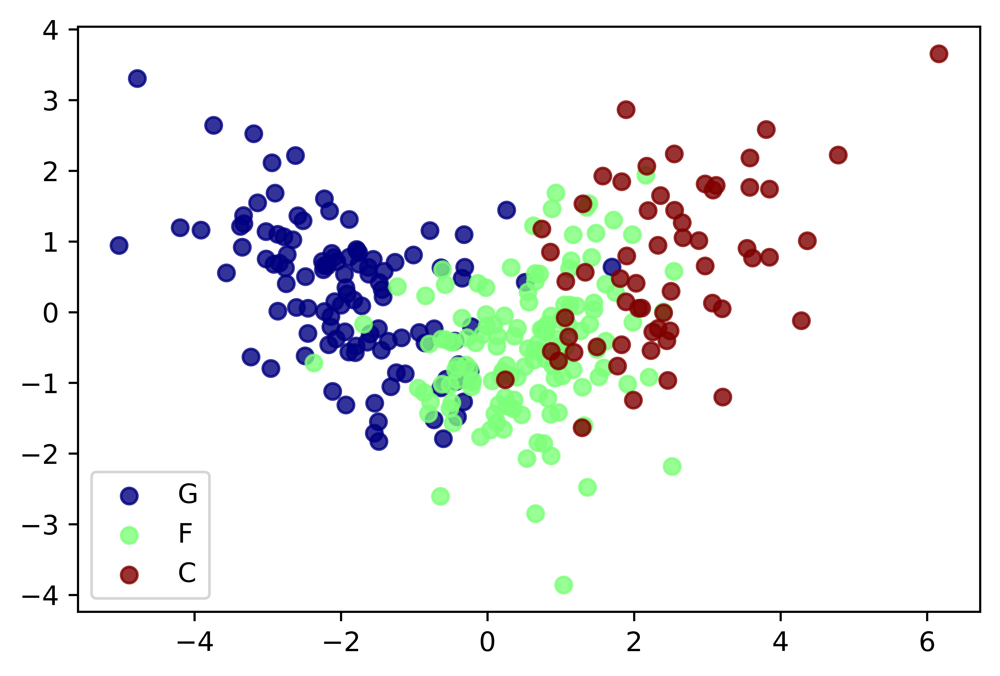

In [7]:
lda = LinearDiscriminantAnalysis(n_components=2)
lda.fit(xtrainstd, ytrain)

x_lda = lda.transform(xtrainstd)

post=''
unique = list(set(ytrain))
colors = [plt.cm.jet(float(i)/max(unique)) for i in unique]
for i, u in enumerate(unique):
    if u==0: post = 'G'
    if u==1: post = 'F'
    if u==2: post = 'C'
    xi = [x_lda[:, 0][j] for j  in range(len(x_lda[:, 0])) if ytrain[j] == u]
    yi = [x_lda[:, 1][j] for j  in range(len(x_lda[:, 1])) if ytrain[j] == u]
    plt.rcParams['figure.dpi'] =1200
    plt.scatter(xi, yi, c=colors[i], label=post, alpha=0.8)
plt.legend()
#plt.savefig('LDA_25min.png')
plt.show()

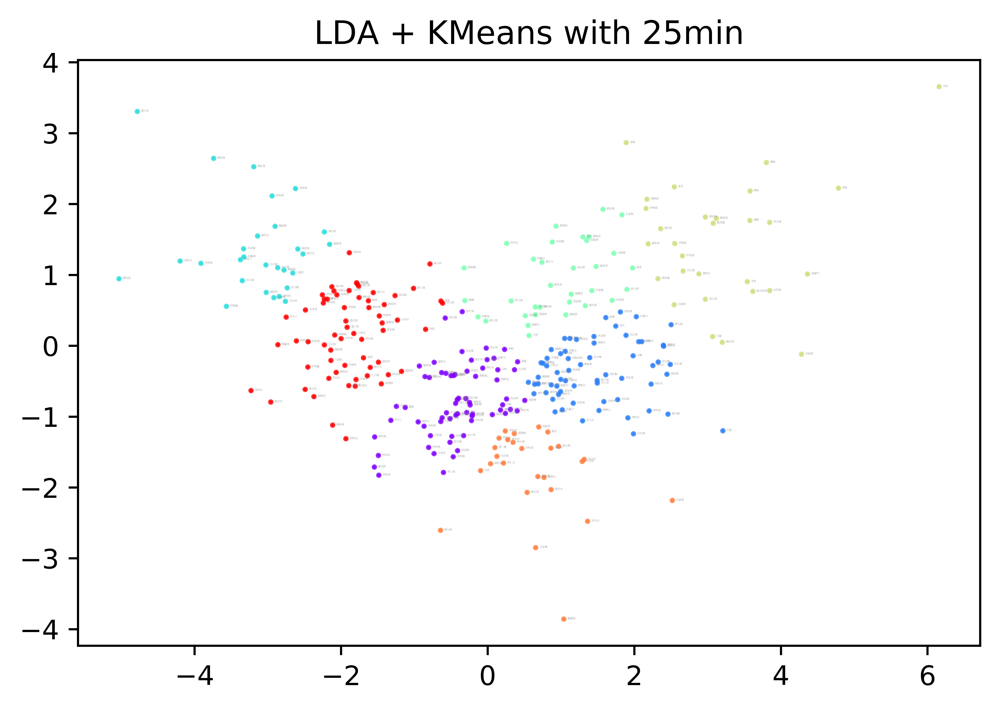

In [8]:
colors = plt.cm.rainbow(np.linspace(0, 1, n_clusters))

kmeans = KMeans(n_clusters=n_clusters, random_state=0).fit(x_lda)
Pos_new = kmeans.labels_

df_lda_kmeans = df[['Name']].copy()
df_lda_kmeans = pd.concat([df_lda_kmeans, pd.DataFrame(x_lda)], axis=1)
df_lda_kmeans['Pos_new'] = Pos_new
df_lda_kmeans.columns = ['Name', 'Dim_1', 'Dim_2', 'New_pos']

clus_col = colors[df_lda_kmeans.New_pos.values]

plot_result(df_lda_kmeans['Dim_1'], df_lda_kmeans['Dim_2'],
            df_lda_kmeans['Name'], clus_col, addname = True, fontsize = 1, 
            title = 'LDA + KMeans with 25min',
            markersize= 1, dpi = 1200, datascale = 1, outfn = 'LDA_KMeans with 25min.png')

In [9]:
silhouette_avg = metrics.silhouette_score(x_lda, Pos_new)
print("Sihouette score: {}".format(silhouette_avg))
km.append(silhouette_avg)

Sihouette score: 0.35696102364348203


## LDA + HAC(per 25 min)

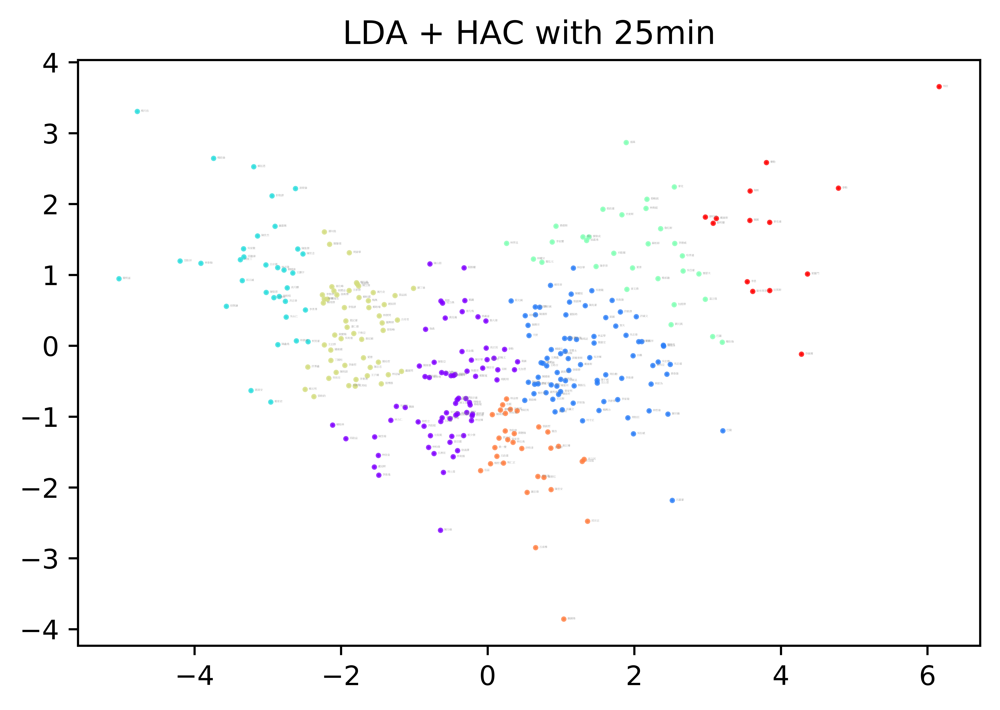

In [10]:
clustering = AgglomerativeClustering(n_clusters=n_clusters).fit(x_lda)
clustering.labels_
Pos_new = clustering.labels_

df_lda_hac = df[['Name']].copy()
df_lda_hac = pd.concat([df_lda_hac, pd.DataFrame(x_lda)], axis=1)
df_lda_hac['Pos_new'] = Pos_new
df_lda_hac.columns = ['Name', 'Dim_1', 'Dim_2', 'New_pos']

clus_col = colors[df_lda_hac.New_pos.values]

plot_result(df_lda_hac['Dim_1'], df_lda_hac['Dim_2'],
            df_lda_hac['Name'], clus_col, addname = True, fontsize = 1, 
            title = 'LDA + HAC with 25min',
            markersize= 1, dpi = 1200, datascale = 1, outfn = 'LDA_HAC with 25min.png')

In [11]:
silhouette_avg = metrics.silhouette_score(x_lda, Pos_new)
print("Sihouette score: {}".format(silhouette_avg))
h.append(silhouette_avg)

Sihouette score: 0.29949811892206196


## t-SNE(cosine) + KMeans(per 25 min)

[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 307 samples in 0.000s...
[t-SNE] Computed neighbors for 307 samples in 0.055s...
[t-SNE] Computed conditional probabilities for sample 307 / 307
[t-SNE] Mean sigma: 0.194442
[t-SNE] KL divergence after 250 iterations with early exaggeration: 199.927032
[t-SNE] KL divergence after 1000 iterations: 0.876253


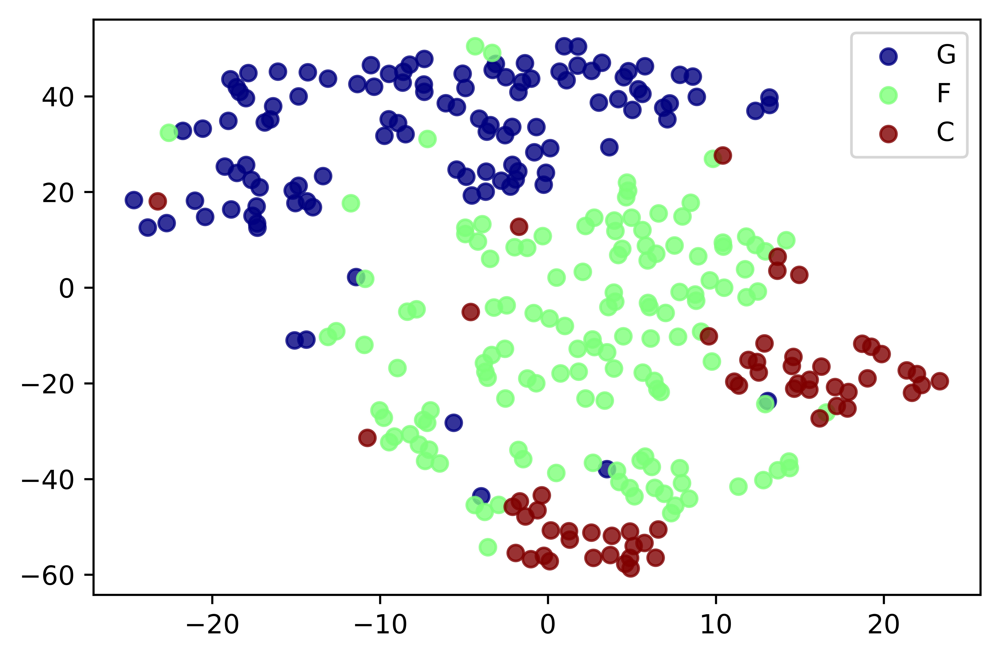

In [12]:
xtrainstd['G'] = df['G'].copy()
xtrainstd['F'] = df['F'].copy()
xtrainstd['C'] = df['C'].copy()

np.random.seed(1001)
tsne_cos = TSNE(n_components=2, early_exaggeration=30, verbose=1, metric = 'cosine', perplexity=10, learning_rate=15)
x_tsne_cos = tsne_cos.fit_transform(xtrainstd)

post=''
unique = list(set(ytrain))
colors = [plt.cm.jet(float(i)/max(unique)) for i in unique]
for i, u in enumerate(unique):
    if u==0: post = 'G'
    if u==1: post = 'F'
    if u==2: post = 'C'
    xi = [x_tsne_cos[:, 0][j] for j  in range(len(x_tsne_cos[:, 0])) if ytrain[j] == u]
    yi = [x_tsne_cos[:, 1][j] for j  in range(len(x_tsne_cos[:, 1])) if ytrain[j] == u]
    plt.rcParams['figure.dpi'] =1200
    plt.scatter(xi, yi, c=colors[i], label=post, alpha=0.8)
plt.legend()
#plt.savefig('tsne_cos_25min.png')
plt.show()

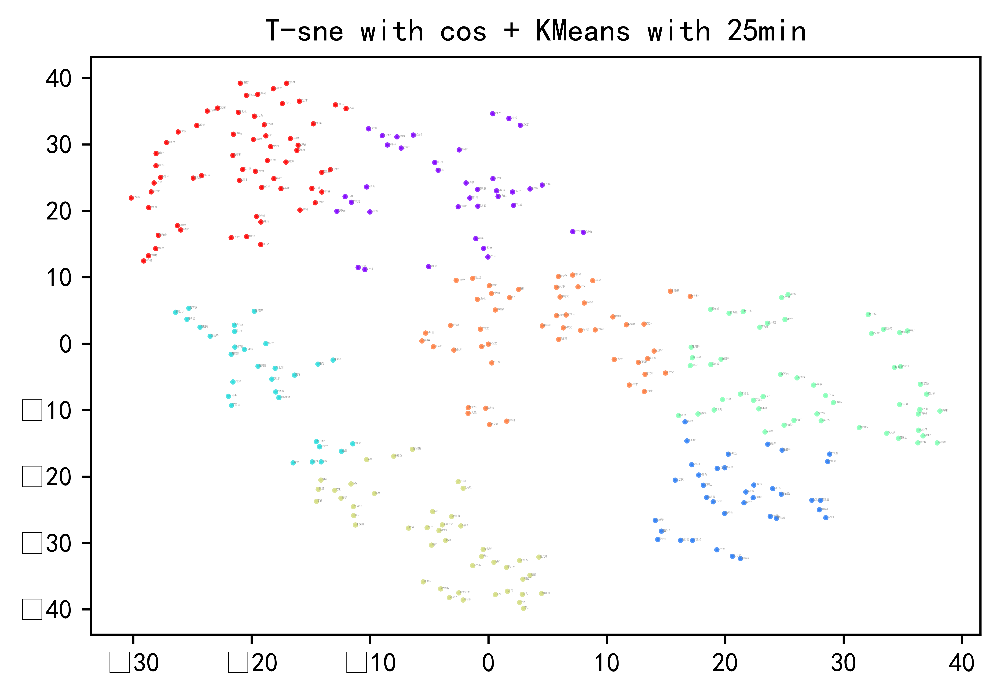

In [13]:
colors = plt.cm.rainbow(np.linspace(0, 1, n_clusters))

kmeans = KMeans(n_clusters=n_clusters, random_state=0).fit(x_tsne_cos)
Pos_new = kmeans.labels_

df_tsne_kmeans = df[['Name']].copy()
df_tsne_kmeans = pd.concat([df_tsne_kmeans, pd.DataFrame(x_tsne_cos)], axis=1)
df_tsne_kmeans['Pos_new'] = Pos_new
df_tsne_kmeans.columns = ['Name', 'Dim_1', 'Dim_2', 'New_pos']

clus_col = colors[df_tsne_kmeans.New_pos.values]

plot_result(df_tsne_kmeans['Dim_1'], df_tsne_kmeans['Dim_2'],
            df_tsne_kmeans['Name'], clus_col, addname = True, fontsize = 1, 
            title = 'T-sne with cos + KMeans with 25min',
            markersize= 1, dpi = 1200, datascale = 1, outfn = 'T-sne_KMeans with 25min.png')

In [14]:
silhouette_avg = metrics.silhouette_score(x_tsne_cos, Pos_new)
print("Sihouette score: {}".format(silhouette_avg))
km.append(silhouette_avg)

Sihouette score: 0.4277571737766266


## t-SNE(cosine) + HAC(per 25 min)

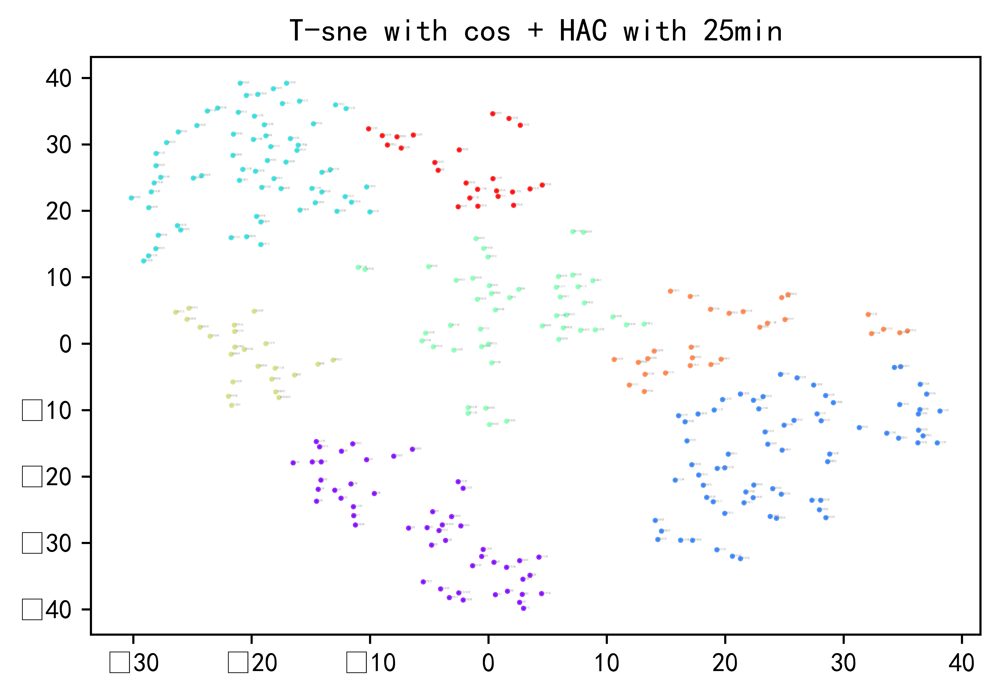

In [15]:
clustering = AgglomerativeClustering(n_clusters=n_clusters).fit(x_tsne_cos)
clustering.labels_
Pos_new = clustering.labels_

df_tsne_hac = df[['Name']].copy()
df_tsne_hac = pd.concat([df_tsne_hac, pd.DataFrame(x_tsne_cos)], axis=1)
df_tsne_hac['Pos_new'] = Pos_new
df_tsne_hac.columns = ['Name', 'Dim_1', 'Dim_2', 'New_pos']

clus_col = colors[df_tsne_hac.New_pos.values]

plot_result(df_tsne_hac['Dim_1'], df_tsne_hac['Dim_2'],
            df_tsne_hac['Name'], clus_col, addname = True, fontsize = 1, 
            title = 'T-sne with cos + HAC with 25min',
            markersize= 1, dpi = 1200, datascale = 1, outfn = 'tsn_HAC with 25min.png', nameshift = 0.1)

In [16]:
silhouette_avg = metrics.silhouette_score(x_tsne_cos, Pos_new)
print("Sihouette score: {}".format(silhouette_avg))
h.append(silhouette_avg)

Sihouette score: 0.41200777888298035


## PCA + KMeans(per 25 min)

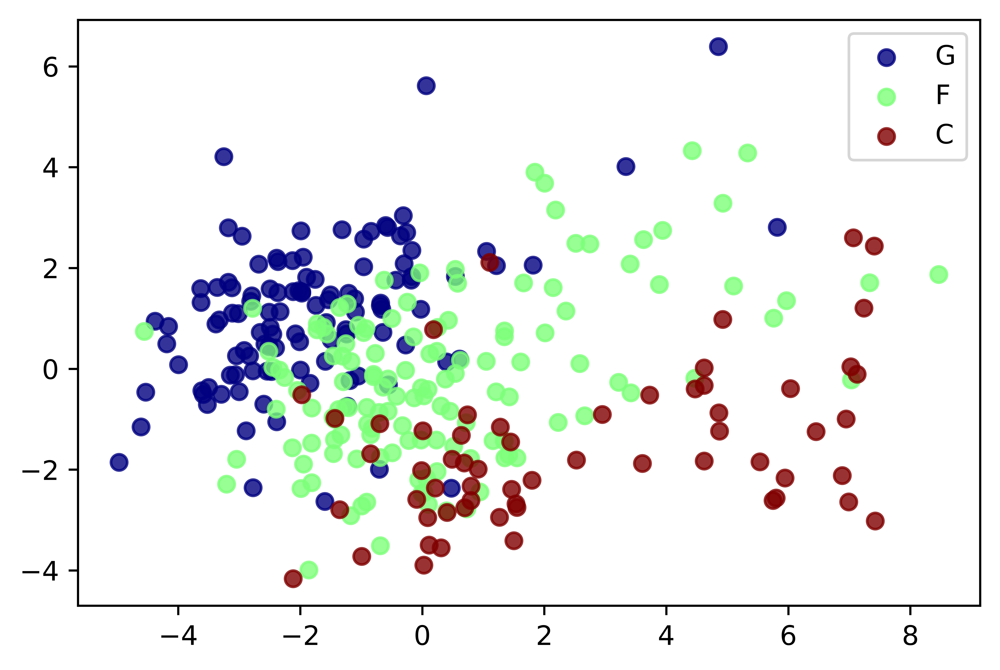

In [13]:
pca=PCA(n_components=2, copy=True)
x_pca=pca.fit_transform(xtrainstd)
post=''
unique = list(set(ytrain))
colors = [plt.cm.jet(float(i)/max(unique)) for i in unique]
for i, u in enumerate(unique):
    if u==0: post = 'G'
    if u==1: post = 'F'
    if u==2: post = 'C'
    xi = [x_pca[:, 0][j] for j  in range(len(x_pca[:, 0])) if ytrain[j] == u]
    yi = [x_pca[:, 1][j] for j  in range(len(x_pca[:, 1])) if ytrain[j] == u]
    plt.rcParams['figure.dpi'] =1200
    plt.scatter(xi, yi, c=colors[i], label=post, alpha=0.8)
plt.legend()
#plt.savefig('pca_25min.png')
plt.show()

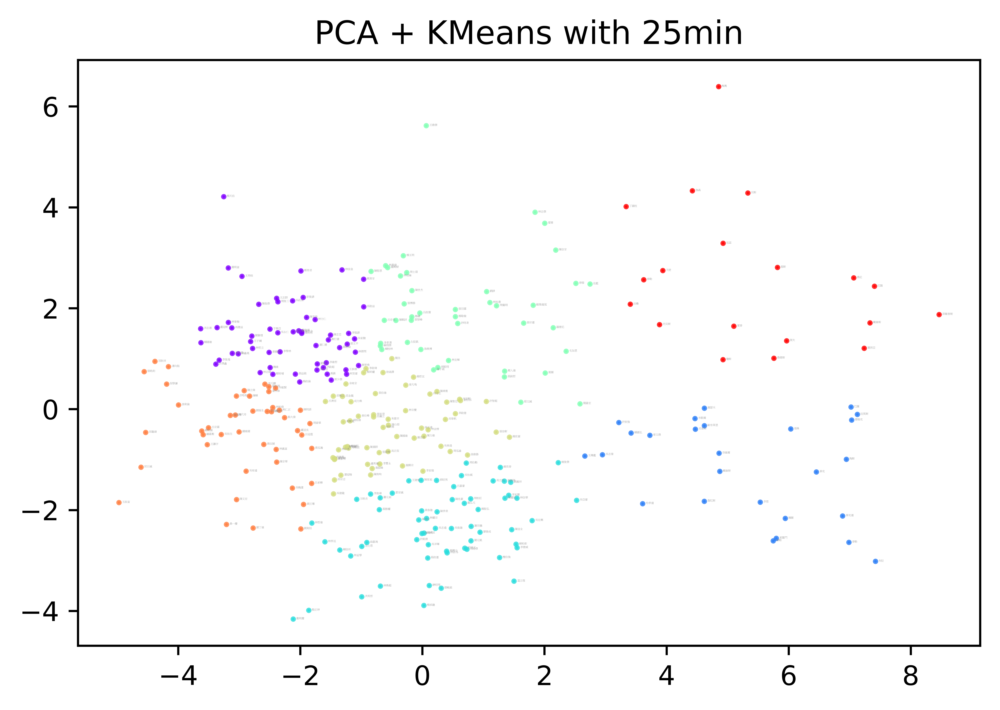

In [15]:
colors = plt.cm.rainbow(np.linspace(0, 1, n_clusters))

kmeans = KMeans(n_clusters=n_clusters, random_state=0).fit(x_pca)
Pos_new = kmeans.labels_

df_pca_kmeans = df[['Name']].copy()
df_pca_kmeans = pd.concat([df_pca_kmeans, pd.DataFrame(x_pca)], axis=1)
df_pca_kmeans['Pos_new'] = Pos_new
df_pca_kmeans.columns = ['Name', 'Dim_1', 'Dim_2', 'New_pos']

clus_col = colors[df_pca_kmeans.New_pos.values]

plot_result(df_pca_kmeans['Dim_1'], df_pca_kmeans['Dim_2'],
            df_pca_kmeans['Name'], clus_col, addname = True, fontsize = 1, 
            title = 'PCA + KMeans with 25min',
            markersize= 1, dpi = 1200, datascale = 1, outfn = 'pca_KMeans with 25min.png')

In [19]:
silhouette_avg = metrics.silhouette_score(x_pca, Pos_new)
print("Sihouette score: {}".format(silhouette_avg))
km.append(silhouette_avg)

Sihouette score: 0.32941970947313304


## PCA + HAC(per 25 min)

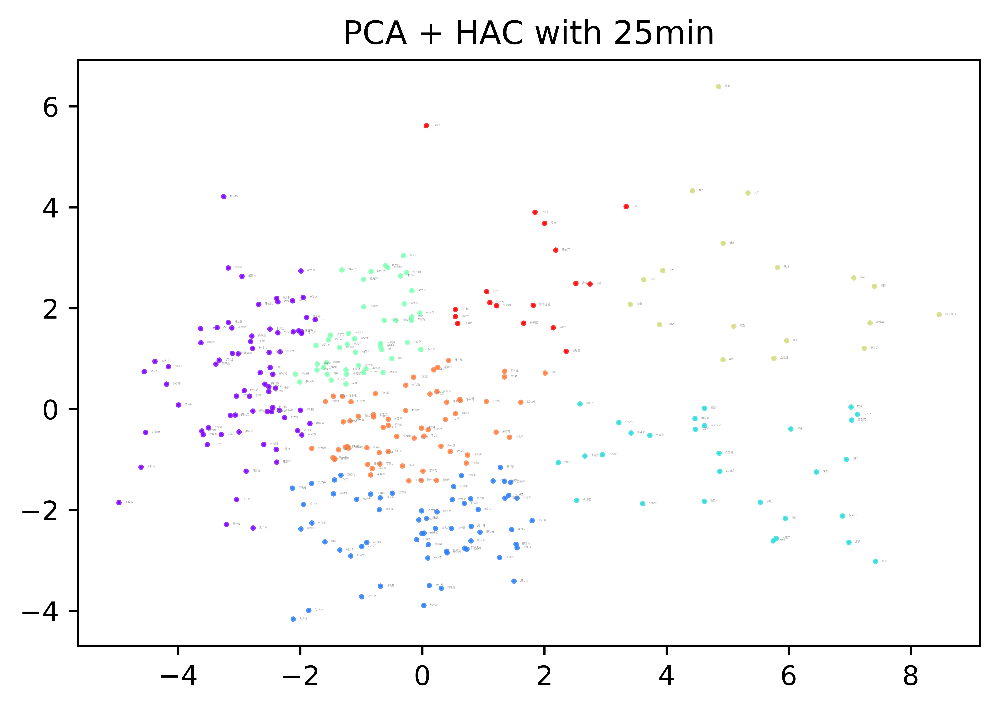

In [16]:
clustering = AgglomerativeClustering(n_clusters=n_clusters).fit(x_pca)
clustering.labels_
Pos_new = clustering.labels_

df_pca_hac = df[['Name']].copy()
df_pca_hac = pd.concat([df_pca_hac, pd.DataFrame(x_pca)], axis=1)
df_pca_hac['Pos_new'] = Pos_new
df_pca_hac.columns = ['Name', 'Dim_1', 'Dim_2', 'New_pos']

clus_col = colors[df_pca_hac.New_pos.values]

plot_result(df_pca_hac['Dim_1'], df_pca_hac['Dim_2'],
            df_pca_hac['Name'], clus_col, addname = True, fontsize = 1, 
            title = 'PCA + HAC with 25min',
            markersize= 1, dpi = 1200, datascale = 1, outfn = 'pca_HAC with 25min.png', nameshift = 0.1)

In [21]:
silhouette_avg = metrics.silhouette_score(x_pca, Pos_new)
print("Sihouette score: {}".format(silhouette_avg))
h.append(silhouette_avg)

Sihouette score: 0.2953285733345921


---

## Silhouette Score:

In [26]:
table_ = pd.DataFrame()
table_['KMeans']=km
table_['HAC']=h
table_.rename(index = {0: "LDA", 1: "t-SNE", 2: "PCA"}, inplace = True) 
table_

,KMeans,HAC
LDA,0.356961,0.299498
t-SNE,0.427757,0.412008
PCA,0.329420,0.295329


In [28]:
df_final = df.copy()
df_final['tsne_pos'] = df_tsne_kmeans['New_pos']
df_final['EFF_25min'] = 25*df_final.EFF/df_final.MinutesPlayedPG
df_final.head()

,Unnamed: 0,Unnamed: 0.1,Name,Team,Pos,Nationality,CTteam,Height,Weight,MinutesPlayedPG,...,2ptsM_25min,2ptsA_25min,3ptsM_25min,3ptsA_25min,ftM_25min,ftA_25min,fgM_25min,fgA_25min,tsne_pos,EFF_25min
0,0,0,夏普,金門酒廠,F,0,0,204,111,32,...,4.531250,9.296875,1.406250,3.906250,2.109375,3.046875,5.937500,13.203125,4,20.390625
1,1,1,賽勒,金門酒廠,C,0,0,211,138,32,...,5.546875,7.890625,0.000000,0.000000,1.562500,3.359375,5.546875,7.890625,4,20.546875
2,2,2,瓊斯,桃園璞園建築,C,0,0,195,82,29,...,5.517241,10.689655,0.344828,1.465517,3.189655,4.224138,5.862069,12.155172,4,17.672414
3,3,3,戴維斯,裕隆納智捷,F,0,0,206,105,35,...,6.214286,13.285714,0.071429,0.571429,3.428571,5.428571,6.357143,13.857143,4,18.071429
4,4,4,史貝斯,臺灣銀行,F,0,0,199,100,27,...,4.074074,7.962963,1.203704,3.055556,2.685185,3.518519,5.370370,11.018519,4,18.148148


In [29]:
tsne0 = df_final.loc[df_final['tsne_pos'] == 0].copy() 
tsne1 = df_final.loc[df_final['tsne_pos'] == 1].copy()  
tsne2 = df_final.loc[df_final['tsne_pos'] == 2].copy() 
tsne3 = df_final.loc[df_final['tsne_pos'] == 3].copy() 
tsne4 = df_final.loc[df_final['tsne_pos'] == 4].copy() 
tsne5 = df_final.loc[df_final['tsne_pos'] == 5].copy() 
tsne6 = df_final.loc[df_final['tsne_pos'] == 6].copy()

meanResult = pd.DataFrame(columns=('0','1','2','3','4','5','6'))
meanResult['0'] = tsne6.describe().loc['mean']
meanResult['1'] = tsne0.describe().loc['mean']
meanResult['2'] = tsne2.describe().loc['mean']
meanResult['3'] = tsne5.describe().loc['mean']
meanResult['4'] = tsne3.describe().loc['mean']
meanResult['5'] = tsne1.describe().loc['mean']
meanResult['6'] = tsne4.describe().loc['mean']
meanResult

## 各個位置每25分鐘的平均EFF貢獻度

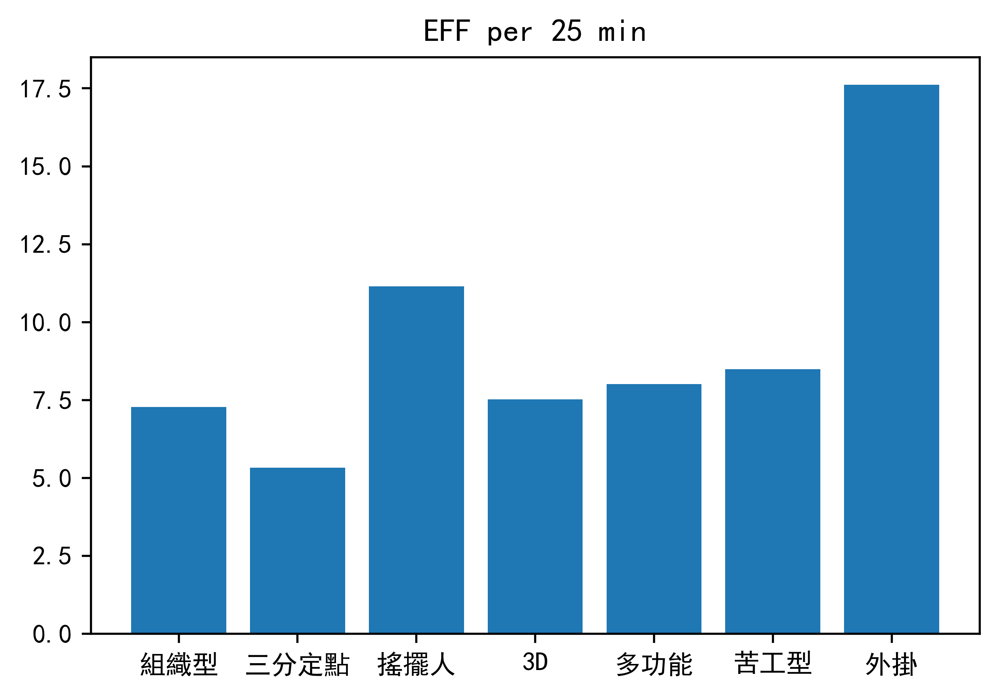

In [32]:
fig, ax = plt.subplots(dpi = 500)

ax.bar(['組織型','三分定點','搖擺人','3D','多功能','苦工型','外掛'] ,meanResult.loc['EFF_25min'])
plt.title("EFF per 25 min")
plt.savefig("EFF25min.png")
plt.show()

## 註：詳細分類結果見投影片